# Importing libraries and functions

In [1]:
#!python -m pip install -U gensim
#!python -m pip install -U tensorflow
#!python -m pip install -U keras
#!python -m pip install -U gem
#!python -m pip install -U addressable
#!pip install Pympler
#!python -m pip install -U wordcloud
#!pip install --user pillow (was already present, though)
#!pip install spacy
#!python -m spacy download en_core_web_sm
#!python -m spacy download en_core_web_md
#!pip install --upgrade gensim
#!pip install pyLDAvis
#!pip install --user pyLDAvis
#!pip install gensim==3.8.3

In [2]:
import numpy as np 
import pandas as pd 
import os
import scipy as sp
import re
import warnings
warnings.filterwarnings('ignore')

from sklearn import metrics
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
# from sklearn.naive_bayes import MultinomialNB
# from sklearn.linear_model import LogisticRegression
# from sklearn.multiclass import OneVsRestClassifier
# from sklearn.preprocessing import MultiLabelBinarizer

from gensim.parsing.preprocessing import remove_stopwords, strip_numeric, strip_punctuation, stem_text
from gensim.models import Word2Vec
from gensim import corpora
# from os import path
# from collections import Counter
# from pympler import asizeof

from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
%matplotlib inline 
from matplotlib import pyplot
import yellowbrick
from yellowbrick.text import FreqDistVisualizer

import spacy

import nltk
nltk.download('words')
from nltk.corpus import stopwords, words 
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.stem import LancasterStemmer
from nltk import FreqDist
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
# from keras.layers import Dense, Input, LSTM , Embedding, Dropout, Activation, GRU, Flatten
# from keras.layers import Bidirectional, GlobalMaxPool1D
# from keras.models import Model, Sequential
# from keras.layers import Convolution1D
# from keras import initializers, regularizers, constraints, optimizers, layers

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Rishika\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Rishika\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Rishika\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Rishika\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [3]:
words = spacy.load('en_core_web_sm')    #Haven't used so far

wordlist = words.vocab
print (len(wordlist))

761


# Downloading required files

In [4]:
#Found a list of words online, going to use it to remove all useless words

words = open('Words.txt')
word = []

for line in words:
    word.append(line.strip())
len(word)

113850

In [5]:
#Created a list of custom stopwords from the one I made here as it wasn't helping directly

stops = open('Stopwords.txt')
stop = []

for line in stops:
    stop.append(line.strip())    #Because the dataframe has stemmed entries
(stop)

['a',
 'about',
 'above',
 'absolutely',
 'actually',
 'after',
 'again',
 'against',
 'ah',
 'ain',
 'aint',
 "ain't",
 'all',
 'also',
 'although',
 'always',
 'am',
 'an',
 'and',
 'any',
 'anybody',
 'anyhow',
 'anyone',
 'anyway',
 'anywho',
 'are',
 'aren',
 "aren't",
 'around',
 'as',
 'at',
 'away',
 'b',
 'back',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'c',
 'can',
 'certainly',
 'come',
 'could',
 'coulda',
 'couldn',
 "couldn't",
 'd',
 'day',
 'definitely',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'e',
 'each',
 'eh',
 'else',
 'even',
 'ever',
 'every',
 'f',
 'feel',
 'few',
 'for',
 'from',
 'further',
 'g',
 'get',
 'give',
 'go',
 'goes',
 'going',
 'gon',
 "gon'",
 'gonna',
 'got',
 'gotta',
 'h',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'hello',
 '

In [95]:
datasetog = pd.read_csv('Smaller_blog_texts2.csv')    #For comparison
datasetin = pd.read_csv("./Blog_Texts_Cleaned2.csv")

print (datasetog.shape)
print (datasetin.shape)
print (datasetin.index)
print (datasetin.columns)
print()

print (datasetin["text"].isnull().any())
print (datasetin["text"].isnull().sum())
print()
#Checking number of empty blog entries (isnull instead of isna)

#print (datasetin["text"].unique()) Not printing because all are unique
print (datasetin["text"].nunique())

datasetin

(24721, 2)
(24363, 1)
RangeIndex(start=0, stop=24363, step=1)
Index(['text'], dtype='object')

False
0

24137


,text
0,info found page file wait team leader process ...
1,team member van mail mail mail
2,test test
3,thank yahoo captur mean show cool link pop pop...
4,interest convers dad morn talk put monei invar...
...,...
24358,job pai bill job suck life job interest big pl...
24359,short post todai call combin music engin man e...
24360,drivel drivel gotten anoth anoth real tickl he...
24361,extens search found real deal name car servic ...


# Data Cleaning (no need, though, as I'm using the cleaned dataset)

#Custom stopwords

#print(stopwords.words('English'))
custom_stopwords = stopwords.words('English')

custom_stopwords.remove("most")
# custom_stopwords.remove("after")

capital_stopwords = ['i', 'oh', 'we', 'we', 'were', "we're", "whe", "she's", "he", "he's", "they", "they've", "she'd", "he'd", 
                     "i've", "i'd", "you'd", "you've", "well", "nbsp", "like", "one", "would", "really", "back", "even", 
                     "much", "could", "urllink", "anyway", 'somehow', 'somewhat', 'think', 'thing', 'go', 'get', 'know', 
                    'want', 'us', 'got', 'went', 'still', 'also', 'take', 'give', 'thought', 'things', 'seem', 'seems', 
                    'seeming', 'seemingly', 'seemed', 'without', 'whatever', 'however']

custom_stopwords.extend(capital_stopwords)
custom_stopwords = list(set(custom_stopwords))
custom_stopwords.sort()
print(custom_stopwords)

#Only stopword removal is needed as it didn't work in the experiment program for some reason

# (i, j) = datasetin.shape
# print (i)

# cleantext = []

# for b in range(i):
#     cleantext.append(" ".join(item for item in datasetin['text'] if item not in custom_stopwords))
# cleantext

datasetin['text2'] = datasetin['text'].apply(lambda x: " ".join([item for item in x.split() if item not in custom_stopwords]))
datasetin

In [7]:
#Checking if the stopwords went away this time
datasetin.loc[datasetin['text'].str.match("then")]    #Stopwords still not gone

,text


In [8]:
datasetin.iloc[19076, 0]

'start walk sock longer access via instead access via sorri inconveni'

In [9]:
datasetin.shape
datasetin.iloc[5, 0]

'coca cola sum thing earli flagship jingl bui world coke tune teach world sing pretti sum post era add sale catchi tune korea coke theme stop pretti sum korea relax coupl stop start feel cours high regard educ math logic deep mani work emot anyth least displai differ scratch pretti similar context differ anywai lose korea repeat yourself stop stop stop everyth alright'

In [10]:
a = pd.Series(datasetin['text'])
a[5]

'coca cola sum thing earli flagship jingl bui world coke tune teach world sing pretti sum post era add sale catchi tune korea coke theme stop pretti sum korea relax coupl stop start feel cours high regard educ math logic deep mani work emot anyth least displai differ scratch pretti similar context differ anywai lose korea repeat yourself stop stop stop everyth alright'

#Just understanding join and split functions here
text = "Hello, good morning"
print (text.split())
print (" ".join(text.split()))

#Expanding contractions
Contractions = {"'s": " is", "n't": " not", "'m": " am", "'ll": " will", "'d": " would", "'ve": " have", "'re": " are", 
              "kinda": "kind of", "sorta": "sort of", "oulda": "ould have", "'em": "them", " ur ": " your ", "'in ": "ing ",
              "aaa": "a", "iii": "i", "eee": "ee", "uu": "u", "ooo": "oo", "yy": "y", "hh": "h", "nite ": "night ",
              " reli ": " really ", " n ": " and ", " m ": " am ", " r ": " are ", " dun ": "do not", " iz ": " is ", 
              "coz ": "because ", " cos ": " because ", "cuz ": "because ", "'cause": "because", " nt ": " not ", 
              "E-": "Electronic "}
 
text = "Hello, today's a good day, how're you?"    
    
#Replacing the contractions
def rem_contractions1(text):
    for i in text:
        for key, value in Contractions.items():
            if key in text:
                text = text.replace(key, value)
        return text
(rem_contractions1(dtt))

def rem_contractions2(text):
    for i in text:
        print (i)
        #print ()
rem_contractions2(dtt.text)

#Defining a dictionary of slang words:

file = open("slang.txt", "r")
slang = file.read()
 
#Separating lines in the file
slang = slang.split('\n')

slang_word = []
meaning = []
 
#Storing slang words and meanings in different lists
for line in slang:
    temp = line.split("=")
    slang_word.append(temp[0])
    meaning.append(temp[-1])
    
#Replacing the slang words with their respective meanings
def rem_slang(text):
    text_tokens = (str(text)).split()
    for i, word in enumerate(text_tokens):
        if word in slang_word:
            idx = slang_word.index(word)
            text[i] = meaning[idx]
    text = " ".join(text_tokens)
    format(text)

def rem_stopwords(t):
    for i in t:
        if i not in custom_stopwords:
            return i
b = "how are you, child"
print (rem_stopwords(["how", "did", "Did"]))
c = word_tokenize(b)
d = word_tokenize("I had only 4 options")
#Will work only with tokens

print (rem_stopwords(c))
print (rem_stopwords(d))
#Problem with this stopword removal is that it seems to ignore words after a punctuation mark or a number
#(I initially thought it was a problem with the tokenizer)
#Therefore, I should remove punctuation before stopword removal

#Lemmatizer and Stemmers
lemmatizer = WordNetLemmatizer()

lanc = LancasterStemmer()
porter = PorterStemmer()

print(lemmatizer.lemmatize("captured"), stem_text("captured"), lanc.stem ("captured"), porter.stem("captured"))
#Works, but there are many words it won't recognise and can only take on one word at a time and no lists

print(lemmatizer.lemmatize("captures"), stem_text("captures"), lanc.stem ("captures"), porter.stem("captures"))
print(lemmatizer.lemmatize("capture"), stem_text("capture"), lanc.stem ("capture"), porter.stem("capture"))

clean_text1 = []

def preprocess1(text):
    text = remove_stopwords(text)
    text = strip_numeric(text)    #Retain important numbers (phone numbers, ratings, dates)
    text = strip_punctuation(text)
    text = stem_text(text)
    #text = re.sub("\''", "", text) 
    #text = re.sub("[^a-zA-Z]", " ", text)    #Not really needed (this and the line above)
    text = ' '.join(text.split())    #split -> tokenize
    text = text.lower() 
    clean_text1.append(text)
    return text

dataset['clean_text1'] = dataset['text'].apply(lambda x: preprocess1(x))
dataset.head()

clean_text2 = []

def preprocess2(text):
    #New stopwords function, tokenize and lemmatize (remove punctuation before tokenization)
    text = strip_punctuation(text) 
    text = strip_numeric(text)    #Retain important numbers (phone numbers, ratings, dates)
    text = text.lower()    #Not sure if this is needed (okay, so it is needed for lemmatization)
    text = rem_stopwords(text)    #Code was giving problems until stopword removal was shifted above tokenization
    text = word_tokenize(text)
    text = ' '.join([lemmatizer.lemmatize(w) for w in text])    #Splitting the text was creating a problem
    clean_text2.append(text)
    return text

#But the lemmatizer doesn't seem to have worked better than the stemmer here

dataset['clean_text2'] = dataset['text'].apply(lambda x: preprocess2(x))
dataset.head()
#Returning an empty list for some reason

clean_text3 = []

def preprocess3(text):   
    #New stopwords function, tokenize and lemmatize (remove punctuation before tokenization)
    text = re.sub("[^a-zA-Z]", " ", text)    
    text = text.lower()
    text = rem_contractions(text)
    #text = rem_slang(text)    #Some problems with these 2 lines
    #text = word_tokenize(text)
    text = porter.stem(text)
    text = [lemmatizer.lemmatize(words) for words in text if words not in custom_stopwords]
    text = " ".join(text)
    clean_text3.append(text)
    return text

dataset['clean_text3'] = dataset['text'].apply(lambda x: preprocess3(x))
dataset.head()

In [11]:
#Checking the top 100 most frequent words
text = " ".join(list(datasetin['text'].values))    #A string containing thw whole dataset
text

all_words = text.split() # list of all the words in the corpus
fdist = FreqDist(all_words) # a frequency distribution of words (word count over the corpus)
k = 100 # say you want to see the top 10,000 words
top_k_words, _ = zip(*fdist.most_common(k)) # unzip the words and word count tuples
print(top_k_words)

('good', 'peopl', 'love', 'work', 'new', 'year', 'life', 'last', 'thing', 'todai', 'friend', 'first', 'night', 'call', 'talk', 'read', 'us', 'thought', 'week', 'plai', 'home', 'two', 'gui', 'most', 'live', 'person', 'end', 'god', 'mean', 'get', 'school', 'long', 'find', 'watch', 'great', 'show', 'anoth', 'want', 'ask', 'post', 'mani', 'next', 'world', 'place', 'better', 'start', 'happen', 'pretti', 'na', 'word', 'fun', 'someon', 'movi', 'hour', 'man', 'name', 'bad', 'sure', 'put', 'hope', 'dai', 'girl', 'guess', 'help', 'feel', 'hous', 'head', 'same', 'write', 'old', 'come', 'anyth', 'best', 'part', 'happi', 'everyon', 'turn', 'keep', 'chang', 'came', 'walk', 'final', 'wait', 'stuff', 'game', 'believ', 'point', 'morn', 'left', 'nice', 'everyth', 'interest', 'big', 'enough', 'book', 'quit', 'differ', 'kid', 'leav', 'done')


# Building feature list and dictionary

In [65]:
#X1 = dataset["clean_text1"]
#X2 = dataset["clean_text2"]
#X3 = dataset["clean_text3"]
#print(len(clean_text1))
#print(len(X1))
#print(len(clean_text2))
#print(len(X2))
# print(len(clean_text3))
# print(len(X3))

#Model (don't run)

X = df1

max_features = 6000
tokenizer = Tokenizer(num_words=max_features)
tokenizer.fit_on_texts(X)
list_tokenized = tokenizer.texts_to_sequences(X)

maxlen = 130
X = pad_sequences(list_tokenized, maxlen=maxlen)

#Tokenize using CountVectorizer
#Fit vectors, get features
#Build a dictionary corpus
#Use word2vec/glove/document2vec based on the corpus (How to build your own word2vec/doc2vec model)


<class 'list'>
24363
coca cola sum thing earli flagship jingl bui world coke tune teach world sing pretti sum post era add sale catchi tune korea coke theme stop pretti sum korea relax coupl stop start feel cours high regard educ math logic deep mani work emot anyth least displai differ scratch pretti similar context differ anywai lose korea repeat yourself stop stop stop everyth alright


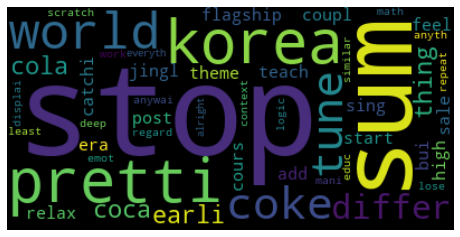

In [13]:
df1 = list(datasetin['text'].values)
print (type(df1))
print (len(df1))
print (df1[5]) #Not using df1 anywhere

wordcloud = WordCloud().generate(df1[5])
#Parameters: max_font_size, max_words, background_color

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#Shows that the topic is real estate or property dealership (can be classified under "Real Estate")

In [14]:
df3 = datasetin[['text']]
df3

,text
0,info found page file wait team leader process ...
1,team member van mail mail mail
2,test test
3,thank yahoo captur mean show cool link pop pop...
4,interest convers dad morn talk put monei invar...
...,...
24358,job pai bill job suck life job interest big pl...
24359,short post todai call combin music engin man e...
24360,drivel drivel gotten anoth anoth real tickl he...
24361,extens search found real deal name car servic ...


In [15]:
df4 = df3['text'].values.tolist()
for m, i in enumerate(df4):
    df4[m] = word_tokenize(df4[m])
df4    #List of list

[['info',
  'found',
  'page',
  'file',
  'wait',
  'team',
  'leader',
  'process',
  'learn'],
 ['team', 'member', 'van', 'mail', 'mail', 'mail'],
 ['test', 'test'],
 ['thank',
  'yahoo',
  'captur',
  'mean',
  'show',
  'cool',
  'link',
  'pop',
  'pop',
  'audio',
  'video',
  'relat',
  'instruct',
  'site',
  'click',
  'pop',
  'audio',
  'button',
  'choos',
  'ado',
  'link',
  'hour',
  'pop',
  'audio',
  'video',
  'stream',
  'enjoi'],
 ['interest',
  'convers',
  'dad',
  'morn',
  'talk',
  'put',
  'monei',
  'invari',
  'real',
  'estat',
  'cash',
  'cash',
  'includ',
  'short',
  'term',
  'invest',
  'year',
  'save',
  'account',
  'reason',
  'real',
  'estat',
  'monei',
  'monei',
  'seen',
  'survei',
  'real',
  'estat',
  'rise',
  'per',
  'year',
  'long',
  'stretch',
  'take',
  'account',
  'crisi',
  'refer',
  'crisi',
  'bail',
  'korea',
  'compar',
  'corpor',
  'bond',
  'fell',
  'modestli',
  'recov',
  'local',
  'stock',
  'market',
  'repr

### Model 1

In [16]:
#CountVectorizer (Bag of Words model)
cv = CountVectorizer()    #Add n/uni grams
Y3 = cv.fit_transform(df1)
features = cv.get_feature_names()

In [17]:
#Y3.any()    #When converted into an array
print (Y3[5]) #when not converted

print (len(features))
features

  (0, 9034)	3
  (0, 7636)	1
  (0, 5470)	1
  (0, 16890)	1
  (0, 4390)	2
  (0, 3568)	1
  (0, 2051)	1
  (0, 3021)	1
  (0, 3081)	1
  (0, 16275)	3
  (0, 4973)	1
  (0, 6019)	1
  (0, 8754)	1
  (0, 18957)	2
  (0, 3079)	2
  (0, 17457)	2
  (0, 16687)	1
  (0, 15067)	1
  (0, 12749)	3
  (0, 12573)	1
  (0, 5361)	1
  (0, 152)	1
  (0, 14245)	1
  (0, 2448)	1
  (0, 16847)	1
  (0, 16022)	5
  (0, 13626)	1
  (0, 3563)	1
  (0, 15885)	1
  (0, 5805)	1
  (0, 13561)	1
  (0, 5042)	1
  (0, 9995)	1
  (0, 9542)	1
  (0, 4101)	1
  (0, 9862)	1
  (0, 18944)	1
  (0, 5178)	1
  (0, 639)	1
  (0, 9239)	1
  (0, 4564)	1
  (0, 14501)	1
  (0, 15046)	1
  (0, 3392)	1
  (0, 641)	1
  (0, 9599)	1
  (0, 13706)	1
  (0, 19102)	1
  (0, 422)	1
19155


['aa',
 'aah',
 'aal',
 'aardvark',
 'aba',
 'aback',
 'abandon',
 'abat',
 'abbei',
 'abbot',
 'abbrevi',
 'abdic',
 'abdomen',
 'abdomin',
 'abduct',
 'abductor',
 'aberr',
 'abet',
 'abhor',
 'abhorr',
 'abi',
 'abid',
 'abigail',
 'abil',
 'abject',
 'abl',
 'ablaz',
 'ablut',
 'abneg',
 'abnorm',
 'abo',
 'aboard',
 'abod',
 'abolish',
 'abolit',
 'abomin',
 'aborigin',
 'abort',
 'abound',
 'abov',
 'abras',
 'abreast',
 'abridg',
 'abroad',
 'abrupt',
 'abruptli',
 'abscess',
 'abscond',
 'absenc',
 'absent',
 'absente',
 'absentmind',
 'absinth',
 'absolut',
 'absolv',
 'absorb',
 'absorpt',
 'abstain',
 'abstin',
 'abstract',
 'abstractli',
 'absurd',
 'absurdli',
 'abund',
 'abundantli',
 'abus',
 'abut',
 'abuzz',
 'abysm',
 'abyss',
 'ac',
 'academ',
 'academi',
 'academia',
 'acced',
 'acceler',
 'accent',
 'accentu',
 'accept',
 'access',
 'accessori',
 'accid',
 'accident',
 'acclaim',
 'acclim',
 'accolad',
 'accommod',
 'accompani',
 'accompanist',
 'accomplic',
 'acco

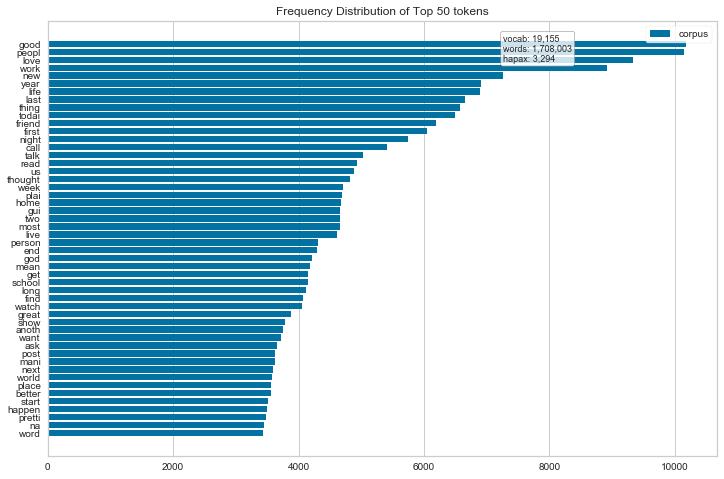

In [18]:
pyplot.figure(figsize=(12, 8))
visualizer = FreqDistVisualizer(features=features)
visualizer.fit(Y3)
for label in visualizer.ax.texts:
    label.set_size(10)
visualizer.poof()

### Model 2

In [19]:
#TF-IDF Vectorizer 
tfid = TfidfVectorizer(decode_error='ignore', min_df=2)
Y3_2 = tfid.fit_transform(df1)
features2 = tfid.get_feature_names()
#Add features

In [20]:
#Y3_2.any()    When converted into an array
print (type(Y3_2))
print (Y3_2[0:1, :]) #when not converted
print (Y3_2.shape)
print (len(features2))
features2

<class 'scipy.sparse.csr.csr_matrix'>
  (0, 7542)	0.27027432606116725
  (0, 10411)	0.34560243629211906
  (0, 7526)	0.4004118299919665
  (0, 13550)	0.3293353830059099
  (0, 14976)	0.24080659229555215
  (0, 4868)	0.38012244172294907
  (0, 9465)	0.3206043828166378
  (0, 5188)	0.24537068094249503
  (0, 6835)	0.4162264884196281
(24363, 15526)
15526


['aa',
 'aah',
 'aal',
 'aba',
 'aback',
 'abandon',
 'abat',
 'abbei',
 'abbot',
 'abbrevi',
 'abdic',
 'abdomen',
 'abdomin',
 'abduct',
 'aberr',
 'abhor',
 'abhorr',
 'abi',
 'abid',
 'abigail',
 'abil',
 'abject',
 'abl',
 'ablaz',
 'ablut',
 'abneg',
 'abnorm',
 'abo',
 'aboard',
 'abod',
 'abolish',
 'abomin',
 'aborigin',
 'abort',
 'abound',
 'abov',
 'abras',
 'abreast',
 'abridg',
 'abroad',
 'abrupt',
 'abruptli',
 'abscess',
 'abscond',
 'absenc',
 'absent',
 'absente',
 'absentmind',
 'absinth',
 'absolut',
 'absolv',
 'absorb',
 'absorpt',
 'abstain',
 'abstin',
 'abstract',
 'absurd',
 'absurdli',
 'abund',
 'abundantli',
 'abus',
 'abut',
 'abuzz',
 'abysm',
 'abyss',
 'ac',
 'academ',
 'academi',
 'academia',
 'acceler',
 'accent',
 'accentu',
 'accept',
 'access',
 'accessori',
 'accid',
 'accident',
 'acclaim',
 'acclim',
 'accolad',
 'accommod',
 'accompani',
 'accomplic',
 'accomplish',
 'accord',
 'accordingli',
 'accordion',
 'accost',
 'account',
 'accru',
 'ac

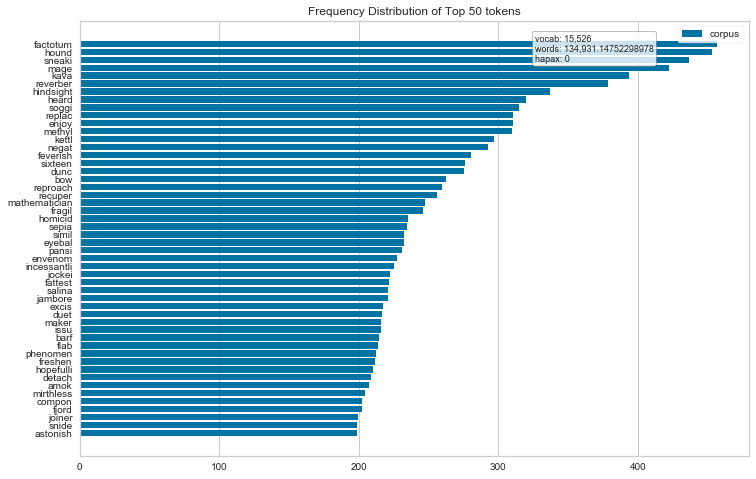

In [21]:
pyplot.figure(figsize=(12, 8))
visualizer = FreqDistVisualizer(features=features)
visualizer.fit(Y3_2)
for label in visualizer.ax.texts:
    label.set_size(10)
visualizer.poof()

### Models 3.1 and 3.2

In [22]:
#Word2Vec Models
model1 = Word2Vec(df4, min_count=1, vector_size=100, window=5)    #CBOW
dict1 = model1.wv.key_to_index

model2 = Word2Vec(df4, min_count=1, vector_size=100, window=5, sg=1)    #Skip-Gram
dict2 = model2.wv.key_to_index

In [23]:
model1.train(df4, total_examples=len(df4), epochs=10)
dict1

{'good': 0,
 'peopl': 1,
 'love': 2,
 'work': 3,
 'new': 4,
 'year': 5,
 'life': 6,
 'last': 7,
 'thing': 8,
 'todai': 9,
 'friend': 10,
 'first': 11,
 'night': 12,
 'call': 13,
 'talk': 14,
 'read': 15,
 'us': 16,
 'thought': 17,
 'week': 18,
 'plai': 19,
 'home': 20,
 'gui': 21,
 'two': 22,
 'most': 23,
 'live': 24,
 'person': 25,
 'end': 26,
 'god': 27,
 'mean': 28,
 'get': 29,
 'school': 30,
 'long': 31,
 'find': 32,
 'watch': 33,
 'great': 34,
 'show': 35,
 'anoth': 36,
 'want': 37,
 'ask': 38,
 'post': 39,
 'mani': 40,
 'next': 41,
 'world': 42,
 'place': 43,
 'better': 44,
 'start': 45,
 'happen': 46,
 'pretti': 47,
 'na': 48,
 'word': 49,
 'fun': 50,
 'someon': 51,
 'movi': 52,
 'hour': 53,
 'man': 54,
 'name': 55,
 'bad': 56,
 'sure': 57,
 'put': 58,
 'hope': 59,
 'dai': 60,
 'girl': 61,
 'guess': 62,
 'help': 63,
 'feel': 64,
 'hous': 65,
 'head': 66,
 'same': 67,
 'write': 68,
 'old': 69,
 'come': 70,
 'anyth': 71,
 'best': 72,
 'part': 73,
 'happi': 74,
 'everyon': 75,
 'tu

In [24]:
model2.train(df4, total_examples=len(df4), epochs=10)
dict2

{'good': 0,
 'peopl': 1,
 'love': 2,
 'work': 3,
 'new': 4,
 'year': 5,
 'life': 6,
 'last': 7,
 'thing': 8,
 'todai': 9,
 'friend': 10,
 'first': 11,
 'night': 12,
 'call': 13,
 'talk': 14,
 'read': 15,
 'us': 16,
 'thought': 17,
 'week': 18,
 'plai': 19,
 'home': 20,
 'gui': 21,
 'two': 22,
 'most': 23,
 'live': 24,
 'person': 25,
 'end': 26,
 'god': 27,
 'mean': 28,
 'get': 29,
 'school': 30,
 'long': 31,
 'find': 32,
 'watch': 33,
 'great': 34,
 'show': 35,
 'anoth': 36,
 'want': 37,
 'ask': 38,
 'post': 39,
 'mani': 40,
 'next': 41,
 'world': 42,
 'place': 43,
 'better': 44,
 'start': 45,
 'happen': 46,
 'pretti': 47,
 'na': 48,
 'word': 49,
 'fun': 50,
 'someon': 51,
 'movi': 52,
 'hour': 53,
 'man': 54,
 'name': 55,
 'bad': 56,
 'sure': 57,
 'put': 58,
 'hope': 59,
 'dai': 60,
 'girl': 61,
 'guess': 62,
 'help': 63,
 'feel': 64,
 'hous': 65,
 'head': 66,
 'same': 67,
 'write': 68,
 'old': 69,
 'come': 70,
 'anyth': 71,
 'best': 72,
 'part': 73,
 'happi': 74,
 'everyon': 75,
 'tu

In [25]:
print (model1.wv["team"])
print (model2.wv["team"])

[ 0.58308756  1.5495787  -0.792168    0.42902902 -3.207789   -1.6245642
 -0.03362182  1.2686479   1.6106658   0.00988452 -0.39450112  0.20784225
 -0.48737007 -0.80189514  1.5113109  -2.6100261   1.7815584  -0.61816573
 -0.5532381   1.6609951  -0.7968637   0.679601    0.2961308  -0.11375475
 -0.9296165  -1.6106586  -0.702957   -0.3690038   0.5060748   0.2791013
  0.7822844  -1.0091531   3.279885   -1.6944228   0.95796436 -0.80441564
  2.5290189  -1.4575034  -2.4305375   1.7877728   0.32808128 -1.3311818
 -0.12224098 -1.0825888   2.176241   -1.8643054   0.9094754  -0.6954833
  2.2304983   1.1301407  -2.3682852  -0.70438826 -0.7549768   1.4341551
 -1.7232165  -2.0048482  -0.44132194  0.39132538  1.716048    1.5898576
  2.139514   -0.97936815  0.39198056  0.7241601  -2.2027273   0.34825432
  1.7083831   1.6056442  -2.621257    2.1395242   0.97040886  0.07034118
  1.0887818  -1.5166783  -0.5119161  -1.0452465  -1.7237221   1.1101525
 -0.6140128  -1.3833505   1.1892526  -0.9317169  -0.541144

In [26]:
rv1 = model1.wv[stem_text("real")]
rv2 = model2.wv[stem_text("estate")]    #Had to stem the parameters to get them to match with the keys found by the model

print (rv1)
print (rv2)

#Didn't work for words, but for alphabets (Finding word vectors)

[-8.54306936e-01 -1.22631624e-01  4.98885840e-01  2.66524941e-01
 -5.64677656e-01 -2.20696855e+00  9.69774604e-01  7.89039552e-01
 -5.44891059e-01  7.58328855e-01 -3.58145118e-01  2.64953327e+00
  5.94555438e-01  1.39050269e+00  9.15902674e-01  1.69006005e-01
  2.17682528e+00  1.02532697e+00 -1.18550289e+00 -8.21158230e-01
  1.71184111e+00  5.69914877e-01  1.05299801e-01  5.74900329e-01
 -1.58891559e+00 -2.52631277e-01  8.42040777e-01  4.28371131e-01
 -7.48537719e-01  1.11821545e-02  5.35971761e-01  9.95811760e-01
  1.58292353e+00 -1.17026579e+00 -1.26096940e+00  6.30827129e-01
  5.30772023e-02 -8.11820149e-01  2.07431364e+00 -6.14898317e-02
 -1.78727365e+00  1.37814319e+00  8.47677350e-01  1.38772929e+00
  4.20530766e-01 -1.30243492e+00 -6.86661661e-01 -1.86519897e+00
  6.56378388e-01 -1.04336965e+00 -5.00946343e-01  1.48233616e+00
  1.44075096e-01  9.20651495e-01  1.52548087e+00 -6.36982620e-01
  1.87935382e-02  9.00480673e-02  3.16670865e-01  3.23774397e-01
  3.33143175e-01 -2.60235

In [27]:
#Most similar word (Problem of KeyError for some words to be fixed by stemming them) 

print (model1.wv.most_similar(stem_text("health")))
print()
print (model2.wv.most_similar("health"))

[('medic', 0.6675558686256409), ('insur', 0.616115391254425), ('mental', 0.5870493054389954), ('physician', 0.5787269473075867), ('financi', 0.5692732930183411), ('poverti', 0.5488303303718567), ('welfar', 0.54494708776474), ('benefit', 0.5393281579017639), ('therapi', 0.5297235250473022), ('nomenclatur', 0.5290238857269287)]

[('scarciti', 0.618243932723999), ('medicaid', 0.589347243309021), ('mental', 0.581764280796051), ('malpractic', 0.5802758932113647), ('care', 0.5790289640426636), ('tamper', 0.5783718824386597), ('medic', 0.571200430393219), ('potabl', 0.5699113011360168), ('insur', 0.56760174036026), ('imbal', 0.5650227069854736)]


In [28]:
#Word similarity (giving Attribute Error)
print(model1.wv.similarity('team', 'tournament'))
print(model2.wv.similarity('dumb', 'dumber'))

0.70184153
0.5270709


In [29]:
model1.wv.vectors

array([[-5.2421138e-02,  7.6712215e-01,  4.9030051e-02, ...,
        -3.6122844e-01,  7.2855107e-02, -1.2465476e-01],
       [-3.3084080e-01, -8.3514288e-02, -2.3723970e-01, ...,
         1.7738681e+00, -1.2622619e+00, -2.8134644e-01],
       [ 8.3730435e-01,  4.9305409e-01, -8.9074916e-01, ...,
        -1.2982856e-01,  7.6258832e-01, -1.1261519e+00],
       ...,
       [-4.1591592e-02,  8.3453253e-02,  4.5193586e-02, ...,
        -1.6531104e-02, -4.2821050e-02, -1.4084121e-02],
       [ 4.6891645e-02, -1.5451513e-03, -6.7695682e-03, ...,
        -2.8434409e-02, -5.5931247e-05, -7.6452315e-02],
       [-4.2513438e-02,  5.1383261e-02,  1.1658769e-02, ...,
        -7.9904996e-02,  2.5702544e-02, -3.9449386e-02]], dtype=float32)

### Model 4

In [30]:
#Doc2Vec Model
#Requires a different type of training data, so will have to load a different dataset here (skipping for now)



from pympler import asizeof
a = 5
b = 45
c = "Hello"
d = "Today is a Wednesday"
e = {}
f = {4, 7, 4, 5, 6}
g = {2, 3, 4, 676}
h = []
i = [5, 7, 8]
j = ["hi", "how are you?"]
k = [5, 6, 7, "hi", "hola"]
l = True
m = False
n = None
o = 5.6
p = 7/12
q = dict()
r = {1:"One", 2:"Two"}
s = {}
s["Uno"] = 1
s["Dos"] = "2"
print ("Int: ", asizeof.asizeof(a), asizeof.asizeof(b))
print ("Float: ", asizeof.asizeof(o), asizeof.asizeof(p))
print ("String: ", asizeof.asizeof(c), asizeof.asizeof(d))
print ("Sets: ", asizeof.asizeof(e), asizeof.asizeof(f), asizeof.asizeof(g))
print ("Lists: ", asizeof.asizeof(h), asizeof.asizeof(i), asizeof.asizeof(j), asizeof.asizeof(k))
print("Dictionaries: ", asizeof.asizeof(q), asizeof.asizeof(r), asizeof.asizeof(s))
print ("Boolean: ", asizeof.asizeof(l), asizeof.asizeof(m))
print ("None:", asizeof.asizeof(n))

# Data Visualization

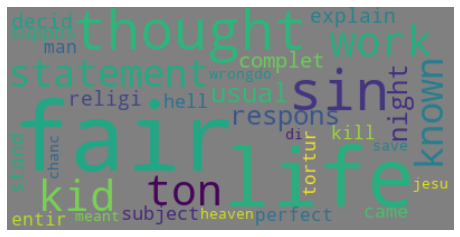

fair work ton kid statement known respons usual fair night complet thought thought explain life fair decid religi stand subject came life suppos fair hell fair most perfect man sin entir life tortur kill sin wrongdo life fair jesu di save chanc heaven life fair meant


In [31]:
wordcloud = WordCloud(background_color="Gray").generate(df1[88])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#Seems like the topic is violence, crime, death or health

print (df1[88])
#So it's mental health or self-harm (can be classified under "Mental Health")

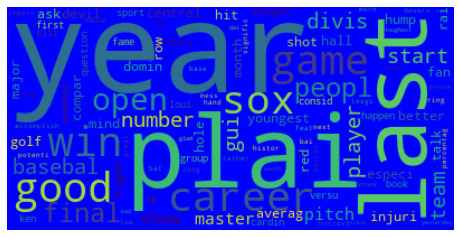

thought weekend happen sport ken red final versu loui cardin peopl ask basebal hall fame peopl ask question cours consid number first player hit elit group book especi youngest player ag accomplish feat youngest signific prove injuri last year mess potenti histor career rather great career number career bat averag slug base percentag hit plu star player leagu domin good shot next year win ring year plai gui deserv hall hand plai long year number low career impact game compar other hottest team bai devil rai believ gui row morn yesterdai mind row bad plai toughest divis basebal year game behind fan good game place glad heart attack anoth dai note mileston cring red sox game abov devil rai east panick least try sox usual swoon singl year especi plai fan thing focu most trot start plai better pitch better offens superior opposit last year team fact talk wild card texa good young lineup averag pitch team pick earlier year nag injuri roster suspect start pitch lucki finish tough west strugg

In [32]:
wordcloud = WordCloud(max_words=100, background_color="Blue").generate(df1[999])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#Seems like the topic is sports

print (df1[999])
#So it's sports (can be classified under "Thoughts")

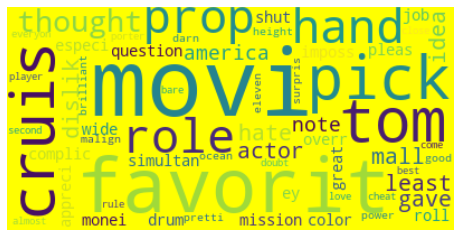

hate actor pick movi dislik least prop gave idea mall america note question movi role pick role complic favorit tom cruis movi like mission imposs especi ey wide shut favorit tom cruis movi drum roll pleas color monei hand tom cruis simultan overr appreci like movi thought great job height power malign brilliant favorit movi ocean eleven surpris thought pretti darn good prop everyon love porter doubt best movi hand come close player second favorit movi favorit almost cheat pick bare rule


In [33]:
wordcloud = WordCloud(max_words=100, background_color="Yellow").generate(df1[6784])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#Seems like the text is about travelling

print (df1[6784])
#It is about a vacation

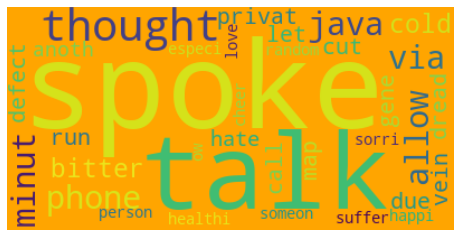

spoke via phone java allow minut bitter cold talk privat call due dread thought cut let defect gene run map vein hate anoth person suffer love spoke thought healthi ow happi talk someon especi sorri random cheer


In [34]:
wordcloud = WordCloud(max_words=50, background_color="Orange").generate(df1[10000])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#Seems like the topic is food

print (df1[10000])
#This seems like it is about food

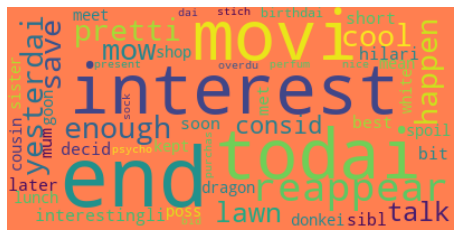

yesterdai pretti cool interest enough happen todai save mow lawn talk todai consid interestingli met soon movi mum sibl decid later hilari best bit short end dragon meet donkei spoil mean lunch interest reappear cousin poss white goon kept reappear shop sister birthdai present dai overdu end purchas nice stich perfum psycho sock bid farewel mind two movi quit fun often end sit long excel


['info found page file wait team leader process learn',
 'team member van mail mail mail',
 'test test',
 'thank yahoo captur mean show cool link pop pop audio video relat instruct site click pop audio button choos ado link hour pop audio video stream enjoi',
 'interest convers dad morn talk put monei invari real estat cash cash includ short term invest year save account reason real estat monei monei seen survei real estat rise per year long stretch take account crisi refer crisi bail korea compar corpor bond fell modestli recov local stock market repres version dow index gone appreci abov high point point link real estat sens convers note real big elit real estat investor billion convert properti dad seem flabbergast heck million dollar retir risk real estat south asset exampl north toot horn louder move countri worth cent crisi drop vi vi bad invest fall victim scam latest good morn citi project toast ladi lost everyth comment tear rich person beggar saber rattl north korea weak exch

In [197]:
wordcloud = WordCloud(max_words=50, background_color="Coral").generate(df1[14000])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

print (df1[14000])

df1

In [36]:
test1 = str(df1)
test1

"['info found page file wait team leader process learn', 'team member van mail mail mail', 'test test', 'thank yahoo captur mean show cool link pop pop audio video relat instruct site click pop audio button choos ado link hour pop audio video stream enjoi', 'interest convers dad morn talk put monei invari real estat cash cash includ short term invest year save account reason real estat monei monei seen survei real estat rise per year long stretch take account crisi refer crisi bail korea compar corpor bond fell modestli recov local stock market repres version dow index gone appreci abov high point point link real estat sens convers note real big elit real estat investor billion convert properti dad seem flabbergast heck million dollar retir risk real estat south asset exampl north toot horn louder move countri worth cent crisi drop vi vi bad invest fall victim scam latest good morn citi project toast ladi lost everyth comment tear rich person beggar saber rattl north korea weak exchang

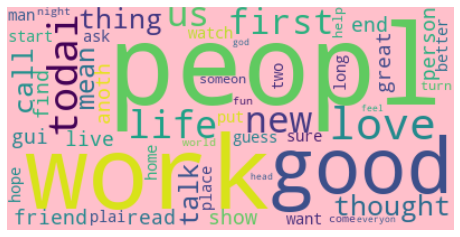

In [37]:
wordcloud = WordCloud(max_words=50, background_color="Pink").generate(test1)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


# Topical Analysis
### Best libraries: Gensim, LSA, LDA, NLTK, SpaCy, Scikit-learn

In [38]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

In [39]:
features2

['aa',
 'aah',
 'aal',
 'aba',
 'aback',
 'abandon',
 'abat',
 'abbei',
 'abbot',
 'abbrevi',
 'abdic',
 'abdomen',
 'abdomin',
 'abduct',
 'aberr',
 'abhor',
 'abhorr',
 'abi',
 'abid',
 'abigail',
 'abil',
 'abject',
 'abl',
 'ablaz',
 'ablut',
 'abneg',
 'abnorm',
 'abo',
 'aboard',
 'abod',
 'abolish',
 'abomin',
 'aborigin',
 'abort',
 'abound',
 'abov',
 'abras',
 'abreast',
 'abridg',
 'abroad',
 'abrupt',
 'abruptli',
 'abscess',
 'abscond',
 'absenc',
 'absent',
 'absente',
 'absentmind',
 'absinth',
 'absolut',
 'absolv',
 'absorb',
 'absorpt',
 'abstain',
 'abstin',
 'abstract',
 'absurd',
 'absurdli',
 'abund',
 'abundantli',
 'abus',
 'abut',
 'abuzz',
 'abysm',
 'abyss',
 'ac',
 'academ',
 'academi',
 'academia',
 'acceler',
 'accent',
 'accentu',
 'accept',
 'access',
 'accessori',
 'accid',
 'accident',
 'acclaim',
 'acclim',
 'accolad',
 'accommod',
 'accompani',
 'accomplic',
 'accomplish',
 'accord',
 'accordingli',
 'accordion',
 'accost',
 'account',
 'accru',
 'ac

In [40]:
STOP

NameError: name 'STOP' is not defined

principalComponents = pca.fit_transform(df1)

principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [ ]:
#BEFORE CLUSTERING

# fit a 2d PCA model to the vectors
X = model2[model2.wv.getitem()]
pca = PCA(n_components=2)
result = pca.fit_transform(X)

# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model2.wv.vocab)

for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

In [ ]:
model2.vocab()

In [ ]:
#AFTER CLUSTERING

def display_pca_scatterplot(model1, words=None, sample=0):
    if words == None:
        if sample > 0:
            words = np.random.choice(list(model1.wv.vocab.keys()), sample)
        else:
            words = [ word for word in model1.vocab ]

word_vectors = np.array([model1[w] for w in words])

twodim = PCA().fit_transform(word_vectors)[:,:2]
pyplot.figure(figsize=(6,6))
pyplot.scatter(twodim[:,0], twodim[:,1], edgecolors='k', c='r')
for word, (x,y) in zip(words, twodim):
    pyplot.text(x+0.05, y+0.05, word)

display_pca_scatterplot(model,
[stem_text('health'), stem_text('mental'), stem_text('physical'), stem_text('medicine'), stem_text('hospital'), 
 stem_text('illness'), stem_text('sickness'), stem_text('doctor'), stem_text('healing'), stem_text('recovering'), 
 stem_text('nursing'), stem_text('study'), stem_text('book'), stem_text('education'), stem_text('grades'), 
 stem_text('marks'), stem_text('school'), stem_text('college'), stem_text('university'), stem_text('institute'), 
 stem_text('homework'), stem_text('assignment'), stem_text('job'), stem_text('work'), stem_text('experience'), 
 stem_text('resume'), stem_text('biodata'), stem_text('office'), stem_text('company'), stem_text('startup'), 
 stem_text('employment'), stem_text('employee'), stem_text('projects'), stem_text('travel'), stem_text('vacation'), 
 stem_text('ticket'), stem_text('hotel'), stem_text('tour'), stem_text('tourist'), stem_text('sightseeing'), 
 stem_text('memento'), stem_text('souvenir'), stem_text('trip'), stem_text('station'), stem_text('airport'), 
 stem_text('fight'), stem_text('hit'), stem_text('fought'), stem_text('hurt'), stem_text('curse'), stem_text('swear'), 
 stem_text('swore'), stem_text('attack'), stem_text('punch'), stem_text('kick'), stem_text('slap'), stem_text('push'), 
 stem_text('injure'), stem_text('harm'), stem_text('injury'), stem_text('pain'), stem_text('bruise'), stem_text('wound'), 
 stem_text('blood'), stem_text('bleed'), stem_text('bloody'), stem_text('fall'), stem_text('fell'), stem_text('target'), 
 stem_text('shoot'), stem_text('shot'), stem_text('kill'), stem_text('slay'), stem_text('fatal'), stem_text('serious')])

display_pca_scatterplot(model1, sample=50)

In [41]:
df4 #LIST OF LIST

[['info',
  'found',
  'page',
  'file',
  'wait',
  'team',
  'leader',
  'process',
  'learn'],
 ['team', 'member', 'van', 'mail', 'mail', 'mail'],
 ['test', 'test'],
 ['thank',
  'yahoo',
  'captur',
  'mean',
  'show',
  'cool',
  'link',
  'pop',
  'pop',
  'audio',
  'video',
  'relat',
  'instruct',
  'site',
  'click',
  'pop',
  'audio',
  'button',
  'choos',
  'ado',
  'link',
  'hour',
  'pop',
  'audio',
  'video',
  'stream',
  'enjoi'],
 ['interest',
  'convers',
  'dad',
  'morn',
  'talk',
  'put',
  'monei',
  'invari',
  'real',
  'estat',
  'cash',
  'cash',
  'includ',
  'short',
  'term',
  'invest',
  'year',
  'save',
  'account',
  'reason',
  'real',
  'estat',
  'monei',
  'monei',
  'seen',
  'survei',
  'real',
  'estat',
  'rise',
  'per',
  'year',
  'long',
  'stretch',
  'take',
  'account',
  'crisi',
  'refer',
  'crisi',
  'bail',
  'korea',
  'compar',
  'corpor',
  'bond',
  'fell',
  'modestli',
  'recov',
  'local',
  'stock',
  'market',
  'repr

In [42]:
import gensim as gm
import gensim.corpora as corpora

# Create Dictionary
id2word = corpora.Dictionary(df4)

# Create Corpus
texts = df4

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

corpus

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1)],
 [(7, 1), (9, 3), (10, 1), (11, 1)],
 [(12, 2)],
 [(13, 1),
  (14, 3),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 2),
  (24, 1),
  (25, 4),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 2),
  (32, 1)],
 [(23, 1),
  (33, 1),
  (34, 2),
  (35, 2),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 2),
  (49, 1),
  (50, 3),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 2),
  (57, 2),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 2),
  (62, 1),
  (63, 3),
  (64, 2),
  (65, 1),
  (66, 2),
  (67, 2),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 7),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 2),
  (83, 1),
  (84, 1),
  (85, 1),
  (86, 1),
  (87, 1),
  (88, 1),
  (89, 1),
  (90, 1),
  (91,

In [43]:
from pprint import pprint

# Build LDA model
lda_model = gm.models.LdaModel(corpus=corpus, id2word=id2word, num_topics=50, alpha='auto', eta='auto', minimum_probability=0.05, random_state=0, passes=4)    
#Increasing the number of passes concentrated the topics

# Parameters:
# Low alpha- Assigns fewer topics to each document
# Low beta- Uses fewer words to model a topic
# High beta- Uses more words, making topics more similar between them
#Increasing the eta made the topics highly concentrated
#Alpha had a similar effect as eta (after a certain value, usually 1/5num_topics)

# Print the Keyword in the 100 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

#Decent combinations for num_topics, alpha and lambda so far (LDAMultiCore):
#(5, 1, 0.08), (25, 5, 0.01), (, , ), (, , ), (, , ), (, , ), (, , ), (, , )

#Decent combinations for num_topics, alpha and lambda so far (LDAModel):
#(25, auto, 0.03-0.07), (50, auto, 1 (min_prob adjusted)), (, , ), (, , ), (, , ), (, , ), (, , ), (, , )

#num_topics=50, alpha='auto', minimum_probability=0.05, eta='auto', lambda=0.4 BEST SO FAR
#per_word_topics=True/False does nothing

[(30,
  '0.046*"wing" + 0.034*"jack" + 0.033*"ad" + 0.028*"hill" + 0.026*"confer" + '
  '0.023*"templat" + 0.021*"mushi" + 0.021*"twilight" + 0.019*"kingdom" + '
  '0.018*"jet"'),
 (1,
  '0.092*"articl" + 0.068*"releas" + 0.057*"new" + 0.054*"fan" + '
  '0.037*"artist" + 0.035*"tag" + 0.029*"version" + 0.025*"cheesi" + '
  '0.024*"obscen" + 0.022*"fox"'),
 (22,
  '0.100*"la" + 0.075*"da" + 0.072*"es" + 0.066*"de" + 0.051*"channel" + '
  '0.039*"un" + 0.030*"pa" + 0.028*"lo" + 0.025*"mi" + 0.021*"keyboard"'),
 (9,
  '0.102*"die" + 0.050*"mir" + 0.044*"bear" + 0.039*"hug" + 0.037*"jesu" + '
  '0.037*"shake" + 0.032*"er" + 0.026*"choru" + 0.024*"heal" + 0.021*"ring"'),
 (38,
  '0.045*"welcom" + 0.044*"dead" + 0.042*"prioriti" + 0.036*"rose" + '
  '0.027*"thread" + 0.025*"appl" + 0.023*"buri" + 0.022*"jealousi" + '
  '0.022*"copi" + 0.021*"ash"'),
 (28,
  '0.208*"christ" + 0.118*"sin" + 0.065*"holi" + 0.053*"jesu" + 0.045*"lazi" + '
  '0.028*"bless" + 0.018*"junk" + 0.017*"hook" + 0.015*"d

In [44]:
for i, topic in lda_model.show_topics(formatted=True, num_topics=50, num_words=10):
    print(str(i+1) + ": " + topic)
    print()

1: 0.067*"life" + 0.017*"joi" + 0.014*"goal" + 0.013*"hubbi" + 0.013*"complain" + 0.013*"upon" + 0.012*"retreat" + 0.012*"habit" + 0.011*"enjoi" + 0.011*"self"

2: 0.092*"articl" + 0.068*"releas" + 0.057*"new" + 0.054*"fan" + 0.037*"artist" + 0.035*"tag" + 0.029*"version" + 0.025*"cheesi" + 0.024*"obscen" + 0.022*"fox"

3: 0.060*"rain" + 0.051*"letter" + 0.039*"search" + 0.023*"engin" + 0.019*"resum" + 0.018*"instant" + 0.014*"yahoo" + 0.014*"project" + 0.012*"job" + 0.012*"storm"

4: 0.062*"sex" + 0.030*"happi" + 0.019*"valentin" + 0.019*"encourag" + 0.017*"sexual" + 0.015*"suffer" + 0.015*"depress" + 0.014*"adult" + 0.012*"cope" + 0.010*"ugli"

5: 0.072*"love" + 0.029*"heart" + 0.022*"dream" + 0.019*"life" + 0.013*"ey" + 0.010*"pain" + 0.010*"fall" + 0.010*"live" + 0.010*"feel" + 0.009*"world"

6: 0.030*"voic" + 0.023*"hear" + 0.022*"sound" + 0.015*"heard" + 0.014*"art" + 0.013*"silenc" + 0.012*"paint" + 0.010*"scream" + 0.010*"yell" + 0.009*"talk"

7: 0.022*"thing" + 0.017*"peopl" +

In [45]:
import pickle
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()

#Feed the LDA model into the pyLDAvis instance
lda_viz = gensimvis.prepare(topic_model=lda_model, corpus=corpus, dictionary=id2word)
LDAvis_data_filepath = os.path.join('./'+str(100))

vis = gensimvis.prepare(topic_model=lda_model, corpus=corpus, dictionary=id2word)
pyLDAvis.enable_notebook()

with open(LDAvis_data_filepath, 'wb') as f:
    pickle.dump(vis, f)   
with open(LDAvis_data_filepath, 'rb') as f:
    vis = pickle.load(f)
    
pyLDAvis.save_html(vis, './_' + str(100) + '.html')
pyLDAvis.display(vis)

#For some reason, while the set of topics is the same for the above 3 cells, the order is different for all the three

C:\Users\Rishika\anaconda3\lib\site-packages\joblib\numpy_pickle.py:104: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  pickler.file_handle.write(chunk.tostring('C'))
C:\Users\Rishika\anaconda3\lib\site-packages\joblib\numpy_pickle.py:104: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  pickler.file_handle.write(chunk.tostring('C'))
C:\Users\Rishika\anaconda3\lib\site-packages\joblib\numpy_pickle.py:104: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  pickler.file_handle.write(chunk.tostring('C'))
C:\Users\Rishika\anaconda3\lib\site-packages\joblib\numpy_pickle.py:104: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  pickler.file_handle.write(chunk.tostring('C'))


In [46]:
#PLAN

#Topic segmentation achieved
#Pick up top 25 words for each LDA topic
#Pick up the pair with the highest similarity index according to model1 (or find most similar words and pick the most commonly-occurring one)
#Assign that as the class name (or do so manually)
#Assign topics to documents if they contain at least 5 relevant words
#Use these classes for supervised learning

In [47]:
lda_model.print_topics(50)

[(0,
  '0.067*"life" + 0.017*"joi" + 0.014*"goal" + 0.013*"hubbi" + 0.013*"complain" + 0.013*"upon" + 0.012*"retreat" + 0.012*"habit" + 0.011*"enjoi" + 0.011*"self"'),
 (1,
  '0.092*"articl" + 0.068*"releas" + 0.057*"new" + 0.054*"fan" + 0.037*"artist" + 0.035*"tag" + 0.029*"version" + 0.025*"cheesi" + 0.024*"obscen" + 0.022*"fox"'),
 (2,
  '0.060*"rain" + 0.051*"letter" + 0.039*"search" + 0.023*"engin" + 0.019*"resum" + 0.018*"instant" + 0.014*"yahoo" + 0.014*"project" + 0.012*"job" + 0.012*"storm"'),
 (3,
  '0.062*"sex" + 0.030*"happi" + 0.019*"valentin" + 0.019*"encourag" + 0.017*"sexual" + 0.015*"suffer" + 0.015*"depress" + 0.014*"adult" + 0.012*"cope" + 0.010*"ugli"'),
 (4,
  '0.072*"love" + 0.029*"heart" + 0.022*"dream" + 0.019*"life" + 0.013*"ey" + 0.010*"pain" + 0.010*"fall" + 0.010*"live" + 0.010*"feel" + 0.009*"world"'),
 (5,
  '0.030*"voic" + 0.023*"hear" + 0.022*"sound" + 0.015*"heard" + 0.014*"art" + 0.013*"silenc" + 0.012*"paint" + 0.010*"scream" + 0.010*"yell" + 0.009*"t

In [176]:
topics = pd.read_excel("Topics.xlsx")
topics = topics[['Number', 'Topic']]
topics.head()

,Number,Topic
0,0,Slice of Life
1,1,Journalism
2,2,Employment
3,3,Romance
4,4,Relationships


In [146]:
#Searching for certain kinds of texts to test the model

searchfor = [stem_text('family')]
df3.loc[df3['text'].str.contains('|'.join(searchfor))]

,text
4,interest convers dad morn talk put monei invar...
7,read new articl north korea opinion scale troo...
17,stand correct yesterdai oasi white sea wrong a...
18,dai interest place us full peopl anyth wrong m...
20,wife pose strang question tonight appar new fa...
...,...
24264,brother sat sat weekend famili place love coun...
24299,famili vacat wednesdai pleas prai safeti god i...
24331,weekend church famili retreat due spiritu atta...
24344,past weekend jimmi enjoi church commun fair ba...


In [195]:
print (datasetog['text'][1010])
print()
print (datasetin['text'][1007])

result = pd.DataFrame(lda_model[corpus[1012]])
result = result.sort_values(by=1, ascending=False)
result.reset_index(drop=True, inplace=True)
result[['Topic Number', 'Probability']] = result[[0, 1]]

tops = []
for i in result['Topic Number']:
    for j in topics['Number']:
        if j==i:
            tops.append(topics['Topic'][j])
result.insert(1, "Topic Name", tops, True)

result[['Topic Number', 'Topic Name', 'Probability']]    #This is the table I am looking for 

So, Miami Dolphin running back  urlLink Ricky Williams is retired ; I say..............good for him!&nbsp; I totally support him quitting a life of football just so he can spend this fall/winter in the Fuji Islands smoking pot out of his bong.&nbsp; Especially since the fact that he was the best player on a team that plays MY favorite team (Pats), twice a year.  Although the timing is suspect, I again thank Ricky for waiting until Antwoin Smith AND Eddie George were signed on to other teams before he called it quits.  Maybe he is a closeted Pats fan, who knew?  The Red Sox need an outfielder since  urlLink Nixon will most likely be out for a loooooong time .&nbsp; I love Gabe Kapler, he's a good spot guy off the bench with great athletism and of course one hell of a right hand, but&nbsp;you you need someone who is more consistent with his bat, and has been in the playoff spotlight before,&nbsp;even though Kapler's hot right now.&nbsp;   I recommend either  urlLink this guy &nbsp;or ESP

,Topic Number,Topic Name,Probability
0,37,Sports/Gaming,0.209569
1,6,General,0.138634
2,13,Everyday,0.122458
3,33,Money,0.091725
4,19,Politics,0.074045
5,20,Live Music,0.059835
6,43,Life,0.056453


# Possible topics:
Health
Science: Technology, Geology
Life: Fashion, Beauty, Hate
Social: Politics, Crime, History, Religion, Media
Entertainment: Cinema, Music, Art
Travel
Employment
Education
Business
Spiritual
Literature
Geography
Philosophy


In [ ]:
#Random ideas I'm trying

In [ ]:
from nltk import FreqDist
all_words = text.split() # list of all the words in your corpus
fdist = FreqDist(all_words) # a frequency distribution of words (word count over the corpus)


In [ ]:
type(fdistist)

In [ ]:
len(fdist)

In [ ]:
k = 100000 #For the top 100,000 words
top_k_words, _ = zip(*fdist.most_common(len(fdist))) # unzip the words and word count tuples
print(fdist)

In [ ]:
stem_text("circumference") in top_k_words

In [ ]:
len(top_k_words)

In [ ]:
#Frequent words I might want to remove:
good
people
work
life
way (wai)
day (dai)
new
come
thing
today (todai)
last
year
first
friend
need
little (littl)
night
hello

# Trying to turn this into supervised learning

In [51]:
#Adding the text preprocessing here

for i in word:
    a = i.strip()
    if a in stop:
        word.remove(i)
print (len(word))

clean_text = []

def preprocess(text):   
    text = text.lower()
    text = strip_punctuation(text) 
    text = strip_numeric(text)
    text = word_tokenize(text)
    text = [w for w in text if w in word]  
    text = " ".join(text)
    text = stem_text(text)  

    clean_text.append(text)
    return text

egtext = "Hello, aaaah then this is 1 trial of the above function oh hrfjnfjm!"

print (preprocess(egtext))

113614
trial abov function


In [52]:
text = "I recently bought some jewelry. It's got diamonds, gold, pearls, rubies, emeralds, opals, ambers, jades, platinum, silver and other precious gems and stones. I got a necklace, a pair of earrings, a bracelet and an anklet. They're all beautiful."
text = preprocess(text)
text

'recent bought jewelri diamond gold pearl rubi emerald opal amber jade platinum silver preciou gem stone necklac pair ear bracelet anklet beauti'

In [53]:
X = []
for i in text.split():
    X.append(i)

#Need to make a list of list
Y = texts
print(len(Y))
Y.append(X)
print(len(Y))

id2word2 = corpora.Dictionary(Y)
corpus2 = [id2word2.doc2bow(t) for t in Y]

# Z = [X]
# id2word3 = corpora.Dictionary(Z)
# corpus3 = [id2word3.doc2bow(t) for t in Z]    
# This approach doesn't work well, only gives a certain kind of result every time (close to random)

24363
24364


In [144]:
print (Y[0])

result = pd.DataFrame(lda_model[corpus2[0]])
result = result.sort_values(by=1, ascending=False)
result.reset_index(drop=True, inplace=True)
result[['Topic Number', 'Probability']] = result[[0, 1]]

tops = []
for i in result['Topic Number']:
    for j in topics['Number']:
        if j==i:
            tops.append(topics['Topic'][j])
result.insert(1, "Topic Name", tops, True)

result[['Topic Number', 'Topic Name', 'Probability']]    #Table predicting topics for the incoming text

['info', 'found', 'page', 'file', 'wait', 'team', 'leader', 'process', 'learn']


,Topic Number,Topic Name,Probability
0,21,Hardware,0.323282
1,36,Catholicism,0.168838
2,39,Internet,0.168140
3,37,Sports/Gaming,0.106293


In [145]:
lda_model[corpus2[-1]]

IndexError: index 19156 is out of bounds for axis 1 with size 19156

In [ ]:
lda_model[corpus2[-4]]

In [ ]:
len(corpus2)

In [ ]:
corpus2[-5]

In [ ]:
len(Y)

In [ ]:
Y

In [159]:
lda_model[corpus[267]]

[(6, 0.3712883),
 (31, 0.054415543),
 (33, 0.085568376),
 (34, 0.149962),
 (35, 0.24671759),
 (39, 0.054423966)]